<a href="https://colab.research.google.com/github/riotrip/ml-smt5/blob/main/Kuis2_Kel4_HoG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Kuis 2 - Kelompok 4 (HoG)**
---
## **Rio Tri Prayogo - 2341720236 - TI 3F/25**

## Load Dataset

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [18]:
import cv2
import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
from skimage.feature import hog

In [19]:
def load_dataset(img_dir):
    img_list = []
    for file_path in Path(img_dir).rglob('*.jpg'):
        img = cv2.imread(str(file_path))
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            label = file_path.parent.name
            img_list.append((img, label))

    print(f"Loaded {len(img_list)} images")
    return img_list

In [20]:
df_dir = '/content/drive/MyDrive/PembelajaranMesin_Rio/kuis2/Vegetable Images/'

In [21]:
df = load_dataset(df_dir)

Loaded 21078 images


In [22]:
def random_img_viz(img_list):
    if len(img_list) == 0:
        print("No images to display")
        return

    idx = np.random.randint(0, len(img_list))
    img, label = img_list[idx]

    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.title(f'Label: {label}\nShape: {img.shape}')


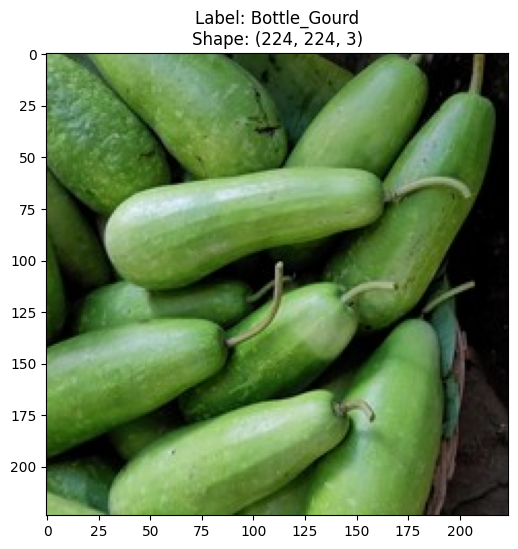

In [23]:
random_img_viz(df)

## Proses Pra Pengolahan Data

In [24]:
preprocessed = []
for img, label in df:
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    enhanced = cv2.createCLAHE().apply(gray)
    denoised = cv2.medianBlur(enhanced, 3)
    preprocessed.append((denoised, label))

In [25]:
print(f"Preprocessed {len(preprocessed)} images")

Preprocessed 21078 images


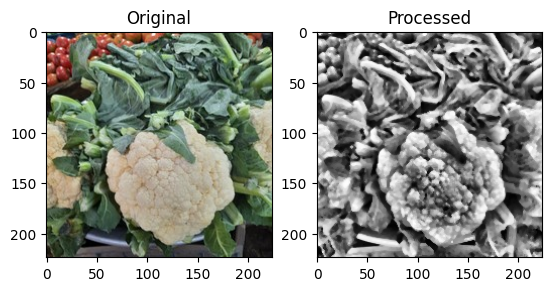

In [26]:
idx = np.random.randint(0, len(df))
plt.subplot(1,2,1).imshow(df[idx][0]), plt.title('Original')
plt.subplot(1,2,2).imshow(preprocessed[idx][0], cmap='gray'), plt.title('Processed')
plt.show()

## Ekstraksi Fitur

In [27]:
def extract_hog_features(images):
    features = []
    labels = []
    for img, label in images:
        # Convert to grayscale if needed
        if len(img.shape) == 3:
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        else:
            gray = img

        # Resize and extract HoG
        resized = cv2.resize(gray, (128, 128))
        hog_feat = hog(resized,
                      pixels_per_cell=(16, 16),
                      cells_per_block=(2, 2),
                      orientations=9,
                      block_norm='L2-Hys')
        features.append(hog_feat)
        labels.append(label)

    return np.array(features), labels

In [29]:
features, labels = extract_hog_features(preprocessed)

In [30]:
features

array([[0.10052983, 0.09535296, 0.24555683, ..., 0.10623975, 0.04948728,
        0.03734132],
       [0.25806874, 0.16137253, 0.07913658, ..., 0.23346921, 0.18213702,
        0.16046722],
       [0.15163652, 0.02301067, 0.0705114 , ..., 0.17143598, 0.10870543,
        0.22470943],
       ...,
       [0.23093652, 0.07691094, 0.12901567, ..., 0.07939773, 0.19361111,
        0.29178916],
       [0.12933759, 0.07490909, 0.24932846, ..., 0.05204087, 0.10007919,
        0.12866936],
       [0.24631363, 0.25089655, 0.25089655, ..., 0.26640549, 0.05618419,
        0.07211773]])

## Reduksi Dimensi

In [31]:
from sklearn.decomposition import PCA

pca = PCA(n_components=0.95)  # mempertahankan 95% informasi
feats_pca = pca.fit_transform(features)

In [32]:
feats_pca

array([[-1.69076174e+00,  2.54978666e-02, -5.43320725e-01, ...,
        -1.99516234e-02, -1.86560423e-01, -2.43132892e-02],
       [ 1.14906343e+00, -3.93613269e-01, -1.81539355e-01, ...,
        -1.98465234e-03, -1.78918915e-02,  4.55136088e-02],
       [-8.98165788e-01, -6.26928429e-01,  4.83669986e-01, ...,
        -7.56252017e-02,  9.66672754e-02, -6.47380210e-02],
       ...,
       [ 2.59316568e+00,  1.65385638e-01,  1.16704615e+00, ...,
         9.80702898e-03,  9.11993855e-02,  4.11339863e-02],
       [-9.31899683e-01, -1.16090704e+00,  8.48786214e-01, ...,
         6.72027212e-03,  8.05443127e-02,  3.05955903e-02],
       [-5.45704346e-01, -1.16580907e+00,  1.20571727e+00, ...,
        -1.10526586e-01, -1.00207853e-01, -3.45119158e-02]])

## Split Data

In [33]:
final_dataset = list(zip(feats_pca, labels))

In [34]:
final_dataset

[(array([-1.69076174e+00,  2.54978666e-02, -5.43320725e-01, -1.53004650e-01,
         -6.82015727e-03,  2.82901493e-01,  4.48412150e-01, -3.47518194e-02,
         -9.96249714e-01, -2.34990701e-02, -5.87461458e-01,  3.07779097e-01,
          8.51701218e-01, -6.06748374e-02,  2.55130906e-01, -7.73992379e-01,
          2.13213847e-01,  6.10424711e-01, -2.30282444e-02,  4.99666110e-02,
          1.03734233e+00,  2.16689172e-02,  1.58093317e-01, -3.64563964e-01,
          1.99210319e-01,  3.22972364e-01,  4.58142412e-01, -2.09573005e-01,
          3.09499414e-01, -3.03288719e-01, -1.99735681e-01, -8.18045046e-02,
         -8.36928744e-01, -1.51081360e-01,  2.63828245e-01, -2.44838856e-01,
          1.26959383e-01, -2.43861710e-01, -1.00476393e-02,  2.80477438e-02,
          2.27197649e-01, -1.27071965e-01,  1.46790073e-01,  6.07457219e-02,
          2.09387941e-01, -1.39814340e-01, -2.05962900e-01, -3.20713014e-01,
         -2.83393532e-01,  9.61768232e-02, -1.61177982e-01, -7.55431669e-02,

In [35]:
X, y = zip(*final_dataset)

X = np.array(X)
y = np.array(y)

In [36]:
from sklearn.model_selection import train_test_split

X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(
    X, y,
    test_size=0.30,
    random_state=0,
    stratify=y
)

In [37]:
X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(
    X, y,
    test_size=0.20,
    random_state=0,
    stratify=y
)

In [38]:
X_train_90, X_test_10, y_train_90, y_test_10 = train_test_split(
    X, y,
    test_size=0.10,
    random_state=0,
    stratify=y
)

In [39]:
from sklearn.model_selection import cross_val_score, StratifiedKFold

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

## Pembuatan Model

In [40]:
splits = {
    "30": (X_train_70, X_test_30, y_train_70, y_test_30),
    "20": (X_train_80, X_test_20, y_train_80, y_test_20),
    "10": (X_train_90, X_test_10, y_train_90, y_test_10)
}

In [41]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

def evaluate(model, X_train, X_test, y_train, y_test):
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)

    return {
        "train_accuracy": accuracy_score(y_train, pred_train),
        "test_accuracy": accuracy_score(y_test, pred_test),
        "precision": precision_score(y_test, pred_test, average='weighted'),
        "recall": recall_score(y_test, pred_test, average='weighted'),
        "f1": f1_score(y_test, pred_test, average='weighted'),
    }


In [42]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
import pickle

def build_svm(Xtr, ytr, Xts, yts, split_name):
    svm = SVC(kernel='rbf', C=10, gamma='scale')
    svm.fit(Xtr, ytr)

    result = evaluate(svm, Xtr, Xts, ytr, yts)

    # tambah info model
    result["model_object"] = svm
    result["split"] = split_name
    return result

In [43]:
from sklearn.neighbors import KNeighborsClassifier

def build_knn(Xtr, ytr, Xts, yts, split_name):
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(Xtr, ytr)

    result = evaluate(knn, Xtr, Xts, ytr, yts)
    result["model_object"] = knn
    result["split"] = split_name
    return result


In [44]:
from sklearn.naive_bayes import GaussianNB

def build_nb(Xtr, ytr, Xts, yts, split_name):
    nb = GaussianNB()
    nb.fit(Xtr, ytr)

    result = evaluate(nb, Xtr, Xts, ytr, yts)
    result["model_object"] = nb
    result["split"] = split_name
    return result

In [45]:
models_30 = {}
models_20 = {}
models_10 = {}

for split_name, (Xtr, Xts, ytr, yts) in splits.items():

    print(f"\n=== Membuat model untuk split {split_name}% ===")

    if split_name == "30":
        models_30["svm"] = build_svm(Xtr, ytr, Xts, yts, "30")
        models_30["knn"] = build_knn(Xtr, ytr, Xts, yts, "30")
        models_30["nb"]  = build_nb (Xtr, ytr, Xts, yts, "30")

    elif split_name == "20":
        models_20["svm"] = build_svm(Xtr, ytr, Xts, yts, "20")
        models_20["knn"] = build_knn(Xtr, ytr, Xts, yts, "20")
        models_20["nb"]  = build_nb (Xtr, ytr, Xts, yts, "20")

    elif split_name == "10":
        models_10["svm"] = build_svm(Xtr, ytr, Xts, yts, "10")
        models_10["knn"] = build_knn(Xtr, ytr, Xts, yts, "10")
        models_10["nb"]  = build_nb (Xtr, ytr, Xts, yts, "10")



=== Membuat model untuk split 30% ===

=== Membuat model untuk split 20% ===

=== Membuat model untuk split 10% ===


In [46]:
import pickle

def save_all_models(model_dict, prefix):
    for name, model in model_dict.items():
        filename = f"{prefix}_{name}.pkl"
        pickle.dump(model["model"], open(filename, "wb"))
        print(f"✔ Model {prefix}_{name} disimpan.")

In [47]:
def collect_results(models_dict, split_name):
    rows = []
    for clf_name, result in models_dict.items():
        rows.append({
            "Split": split_name,
            "Model": clf_name.upper(),
            "Train Accuracy": result["train_accuracy"],
            "Test Accuracy": result["test_accuracy"],
            "Precision": result["precision"],
            "Recall": result["recall"],
            "F1": result["f1"]
        })
    return rows

In [48]:
all_results = []
all_results += collect_results(models_30, "30")
all_results += collect_results(models_20, "20")
all_results += collect_results(models_10, "10")

df_results = pd.DataFrame(all_results)
df_results


,Split,Model,Train Accuracy,Test Accuracy,Precision,Recall,F1
0,30,SVM,1.000000,0.898482,0.899357,0.898482,0.898455
1,30,KNN,0.843975,0.772138,0.855145,0.772138,0.790345
2,30,NB,0.661583,0.596142,0.614000,0.596142,0.596772
3,20,SVM,1.000000,0.906546,0.907230,0.906546,0.906430
4,20,KNN,0.858261,0.787951,0.862847,0.787951,0.803817
5,20,NB,0.657039,0.593216,0.609325,0.593216,0.593624
6,10,SVM,1.000000,0.913188,0.914372,0.913188,0.912972
7,10,KNN,0.868687,0.811195,0.872679,0.811195,0.825521
8,10,NB,0.651661,0.594402,0.607220,0.594402,0.594182


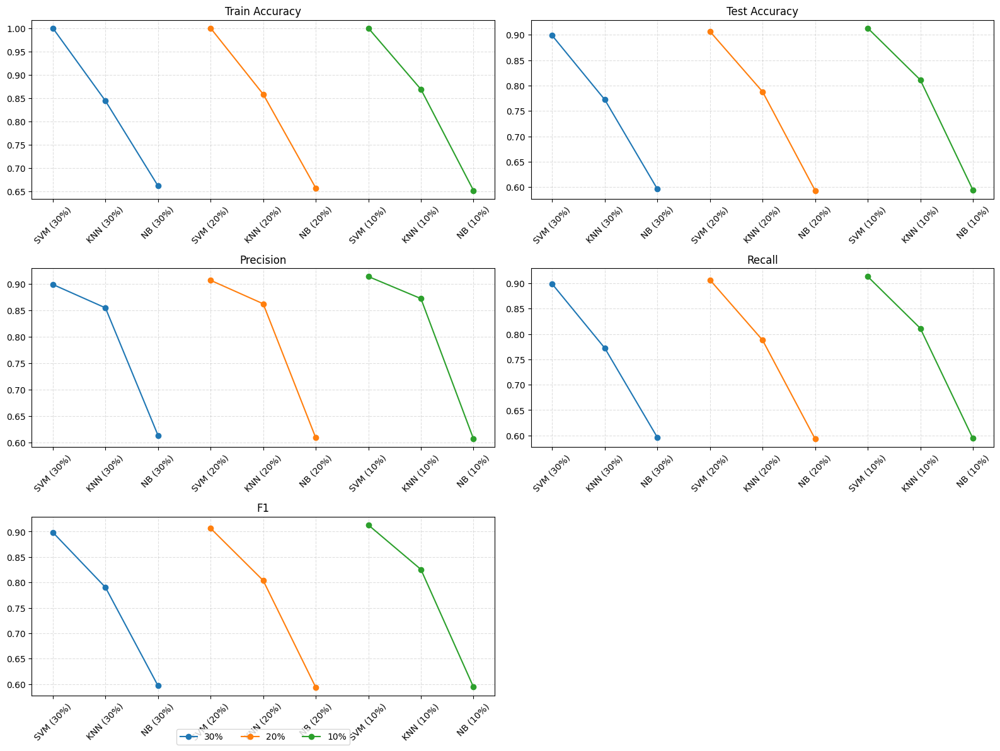

In [49]:
metrics = ["Train Accuracy", "Test Accuracy", "Precision", "Recall", "F1"]

plt.figure(figsize=(16, 12))

for i, metric in enumerate(metrics, 1):
    plt.subplot(3, 2, i)

    for split in df_results["Split"].unique():
        subset = df_results[df_results["Split"] == split]
        x_labels = subset["Model"] + " (" + subset["Split"] + "%)"
        plt.plot(x_labels, subset[metric], marker='o', label=f"{split}%")

    plt.title(metric)
    plt.xticks(rotation=45)
    plt.grid(True, linestyle="--", alpha=0.4)

plt.legend(loc="lower center", bbox_to_anchor=(0.5, -0.3), ncol=3)
plt.tight_layout()
plt.show()
